In [1]:
import sys
sys.path.append('/Applications/anaconda3/lib/python3.8/site-packages/')

from sklearn import datasets
from sklearn.model_selection import train_test_split

import tensorflow as tf
import keras
import numpy as np
import matplotlib.pyplot as plt
import os
import SimpleITK as sitk
# import nibabel
import math
# import texture

from keras.utils.np_utils import to_categorical
from keras import optimizers 
from keras.models import Sequential, Model
from keras.layers import Dense, Activation, Flatten, Conv2D, MaxPooling2D, Dropout, Input, Lambda, Reshape, AveragePooling2D, BatchNormalization
from keras.layers.merge import add, concatenate
from keras.applications.resnet50 import ResNet50, decode_predictions

from keras import backend as K
from keras.utils import plot_model

from keras.callbacks import EarlyStopping, LambdaCallback, ModelCheckpoint 
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
from keras.layers.normalization import BatchNormalization

from keras_unet.utils import plot_imgs, get_augmented, plot_segm_history
from keras_unet.metrics import iou, iou_thresholded
from keras_unet.losses import jaccard_distance 
from keras_unet.models import custom_unet

os.environ["KERAS_BACKEND"] = "plaidml.keras.backend"

-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


In [525]:
# 2. comparison between ROI_RAD_RESAMPLE_TEST vs. ROI_3DGC_RESAMPLE_TEST (delineated by a 3D Grow-cut algorithm)

# delete .DS_Store file in each folder 

# resample
            
resampath = '/Applications/anaconda3/envs/myenv/mywork/unet/data/ROI_RAD_RESAMPLE_HC/Test/'
resampfile = os.listdir(resampath)
resampfile.sort()
num_seg = len(resampfile)
count_seg = 0
for item_resamp in os.listdir(resampath):
    current_resamp = os.path.basename(item_resamp)
    if current_resamp == '.DS_Store':
        fullpath = os.path.join(resampath,current_resamp)
        os.remove(fullpath)

In [526]:
# feature for deep learning (3D): mask

resampath = '/Applications/anaconda3/envs/myenv/mywork/unet/data/ROI_RAD_RESAMPLE_HC/Test/'
resampfile = os.listdir(resampath)
resampfile.sort()
num_img = len(resampfile)

first = sitk.ReadImage(os.path.join(resampath,resampfile[0]))
mask = sitk.GetArrayFromImage(first)

mask_reshape = mask.transpose(1,2,0)

for n in range(len(os.listdir(resampath))):

    i = sitk.ReadImage(os.path.join(resampath,resampfile[n]))
    j = sitk.GetArrayFromImage(i)
    j_reshape = j.transpose(1,2,0)
    mask_reshape = np.dstack((mask_reshape, j_reshape))

In [527]:
# delete .DS_Store file in each folder 

# resample
            
resampath = '/Applications/anaconda3/envs/myenv/mywork/unet/data/ROI_3DGC_RESAMPLE_HC/Test/'
resampfile = os.listdir(resampath)
resampfile.sort()
num_seg = len(resampfile)
count_seg = 0
for item_resamp in os.listdir(resampath):
    current_resamp = os.path.basename(item_resamp)
    if current_resamp == '.DS_Store':
        fullpath = os.path.join(resampath,current_resamp)
        os.remove(fullpath)

In [528]:
# feature for deep learning (3D): mask (now feature)

resampath = '/Applications/anaconda3/envs/myenv/mywork/unet/data/ROI_3DGC_RESAMPLE_HC/Test/'
resampfile = os.listdir(resampath)
resampfile.sort()
num_img = len(resampfile)

first = sitk.ReadImage(os.path.join(resampath,resampfile[0]))
feature = sitk.GetArrayFromImage(first)

feature_reshape = mask.transpose(1,2,0)

for n in range(len(os.listdir(resampath))):

    i = sitk.ReadImage(os.path.join(resampath,resampfile[n]))
    j = sitk.GetArrayFromImage(i)
    j_reshape = j.transpose(1,2,0)
    feature_reshape = np.dstack((feature_reshape, j_reshape))

In [529]:
# Extract slices with masks identified from a test set 

mask_valid = np.zeros((feature_reshape.shape[0], feature_reshape.shape[1]))
feature_valid = np.zeros((feature_reshape.shape[0], feature_reshape.shape[1]))

for n in range(feature_reshape.shape[2]):

    mask_slice = mask_reshape[:,:,n]
    feature_slice = feature_reshape[:,:,n]
    
    if (len(np.unique(mask_slice)) > 1): # only if mask is identified by a radiologist 
        
        mask_valid = np.dstack((mask_valid, mask_slice))
        feature_valid = np.dstack((feature_valid, feature_slice))
        
mask_valid = mask_valid[:,:,1:]
feature_valid = feature_valid[:,:,1:]

print(mask_valid.shape)
print(feature_valid.shape)

(528, 528, 187)
(528, 528, 187)


In [530]:
feature = feature_valid
feature_temp = feature.transpose(2,0,1)
feature_final = feature_temp.reshape((feature_temp.shape[0],feature_temp.shape[1],feature_temp.shape[2],1))

mask = mask_valid
mask_final = mask.transpose(2,0,1)
mask_final = mask_final.reshape((mask_final.shape[0],mask_final.shape[1],mask_final.shape[2],1))

y_pred_3DGC = feature_final 

print(y_pred_3DGC.shape)
print(mask_final.shape)

(187, 528, 528, 1)
(187, 528, 528, 1)


In [531]:
def dice_coef2(y_test, y_pred):
    
    y_test_f = y_test.flatten()
    y_pred_f = y_pred.flatten()
    union = np.sum(y_test_f) + np.sum(y_pred_f)
    if union == 0: return 1
    intersection = np.sum(y_test_f * y_pred_f)
    return 2. * intersection / union

In [532]:
# Copyright (C) 2013 Oskar Maier
# 
# This program is free software: you can redistribute it and/or modify
# it under the terms of the GNU General Public License as published by
# the Free Software Foundation, either version 3 of the License, or
# (at your option) any later version.
# 
# This program is distributed in the hope that it will be useful,
# but WITHOUT ANY WARRANTY; without even the implied warranty of
# MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
# GNU General Public License for more details.
# 
# You should have received a copy of the GNU General Public License
# along with this program.  If not, see <http://www.gnu.org/licenses/>.
#
# author Oskar Maier
# version r0.1.1
# since 2014-03-13
# status Release

# build-in modules

# third-party modules

import numpy
from scipy.ndimage import _ni_support
from scipy.ndimage.morphology import distance_transform_edt, binary_erosion,\
    generate_binary_structure
from scipy.ndimage.measurements import label, find_objects
from scipy.stats import pearsonr

# own modules

# code
def dc(result, reference):
 
    result = numpy.atleast_1d(result.astype(numpy.bool))
    reference = numpy.atleast_1d(reference.astype(numpy.bool))
    
    intersection = numpy.count_nonzero(result & reference)
    
    size_i1 = numpy.count_nonzero(result)
    size_i2 = numpy.count_nonzero(reference)
    
    try:
        dc = 2. * intersection / float(size_i1 + size_i2)
    except ZeroDivisionError:
        dc = 0.0
    
    return dc


def jc(result, reference):

    result = numpy.atleast_1d(result.astype(numpy.bool))
    reference = numpy.atleast_1d(reference.astype(numpy.bool))
    
    intersection = numpy.count_nonzero(result & reference)
    union = numpy.count_nonzero(result | reference)
    
    jc = float(intersection) / float(union)
    
    return jc


def precision(result, reference):

    result = numpy.atleast_1d(result.astype(numpy.bool))
    reference = numpy.atleast_1d(reference.astype(numpy.bool))
        
    tp = numpy.count_nonzero(result & reference)
    fp = numpy.count_nonzero(result & ~reference)
    
    try:
        precision = tp / float(tp + fp)
    except ZeroDivisionError:
        precision = 0.0
    
    return precision


def recall(result, reference):

    result = numpy.atleast_1d(result.astype(numpy.bool))
    reference = numpy.atleast_1d(reference.astype(numpy.bool))
        
    tp = numpy.count_nonzero(result & reference)
    fn = numpy.count_nonzero(~result & reference)

    try:
        recall = tp / float(tp + fn)
    except ZeroDivisionError:
        recall = 0.0
    
    return recall


def sensitivity(result, reference):
    
    return recall(result, reference)


def specificity(result, reference):

    result = numpy.atleast_1d(result.astype(numpy.bool))
    reference = numpy.atleast_1d(reference.astype(numpy.bool))
       
    tn = numpy.count_nonzero(~result & ~reference)
    fp = numpy.count_nonzero(result & ~reference)

    try:
        specificity = tn / float(tn + fp)
    except ZeroDivisionError:
        specificity = 0.0
    
    return specificity


def true_negative_rate(result, reference):
    
    return specificity(result, reference)


def true_positive_rate(result, reference):

    return recall(result, reference)


def positive_predictive_value(result, reference):
    
    return precision(result, reference)


def hd(result, reference, voxelspacing=None, connectivity=1):
    
    hd1 = __surface_distances(result, reference, voxelspacing, connectivity).max()
    hd2 = __surface_distances(reference, result, voxelspacing, connectivity).max()
    hd = max(hd1, hd2)
    
    return hd

def hd95(result, reference, voxelspacing=None, connectivity=1):

    hd1 = __surface_distances(result, reference, voxelspacing, connectivity)
    hd2 = __surface_distances(reference, result, voxelspacing, connectivity)
    hd95 = numpy.percentile(numpy.hstack((hd1, hd2)), 95)
    
    return hd95


def assd(result, reference, voxelspacing=None, connectivity=1):

    assd = numpy.mean( (asd(result, reference, voxelspacing, connectivity), asd(reference, result, voxelspacing, connectivity)) )
    
    return assd


def asd(result, reference, voxelspacing=None, connectivity=1):
 
    sds = __surface_distances(result, reference, voxelspacing, connectivity)
    asd = sds.mean()
    return asd


def ravd(result, reference):

    result = numpy.atleast_1d(result.astype(numpy.bool))
    reference = numpy.atleast_1d(reference.astype(numpy.bool))
        
    vol1 = numpy.count_nonzero(result)
    vol2 = numpy.count_nonzero(reference)
    
    if 0 == vol2:
        raise RuntimeError('The second supplied array does not contain any binary object.')
    
    return (vol1 - vol2) / float(vol2)


def volume_correlation(results, references):

    results = numpy.atleast_2d(numpy.array(results).astype(numpy.bool))
    references = numpy.atleast_2d(numpy.array(references).astype(numpy.bool))
    
    results_volumes = [numpy.count_nonzero(r) for r in results]
    references_volumes = [numpy.count_nonzero(r) for r in references]
    
    return pearsonr(results_volumes, references_volumes) # returns (Pearson'


def volume_change_correlation(results, references):

    results = numpy.atleast_2d(numpy.array(results).astype(numpy.bool))
    references = numpy.atleast_2d(numpy.array(references).astype(numpy.bool))
    
    results_volumes = numpy.asarray([numpy.count_nonzero(r) for r in results])
    references_volumes = numpy.asarray([numpy.count_nonzero(r) for r in references])
    
    results_volumes_changes = results_volumes[1:] - results_volumes[:-1]
    references_volumes_changes = references_volumes[1:] - references_volumes[:-1] 
    
    return pearsonr(results_volumes_changes, references_volumes_changes) # returns (Pearson's correlation coefficient, 2-tailed p-value)

    
def obj_assd(result, reference, voxelspacing=None, connectivity=1):

    assd = numpy.mean( (obj_asd(result, reference, voxelspacing, connectivity), obj_asd(reference, result, voxelspacing, connectivity)) )
    
    return assd

    
    
def obj_asd(result, reference, voxelspacing=None, connectivity=1):

    sds = list()
    labelmap1, labelmap2, _a, _b, mapping = __distinct_binary_object_correspondences(result, reference, connectivity)
    slicers1 = find_objects(labelmap1)
    slicers2 = find_objects(labelmap2)
    for lid2, lid1 in list(mapping.items()):
        window = __combine_windows(slicers1[lid1 - 1], slicers2[lid2 - 1])
        object1 = labelmap1[window] == lid1
        object2 = labelmap2[window] == lid2
        sds.extend(__surface_distances(object1, object2, voxelspacing, connectivity))
    asd = numpy.mean(sds)
    
    return asd

    
def obj_fpr(result, reference, connectivity=1):

    _, _, _, n_obj_reference, mapping = __distinct_binary_object_correspondences(reference, result, connectivity)
    return (n_obj_reference - len(mapping)) / float(n_obj_reference)

    
def obj_tpr(result, reference, connectivity=1):
 
    _, _, n_obj_result, _, mapping = __distinct_binary_object_correspondences(reference, result, connectivity)
    return len(mapping) / float(n_obj_result)


def __distinct_binary_object_correspondences(reference, result, connectivity=1):

    result = numpy.atleast_1d(result.astype(numpy.bool))
    reference = numpy.atleast_1d(reference.astype(numpy.bool))
    
    # binary structure
    footprint = generate_binary_structure(result.ndim, connectivity)
    
    # label distinct binary objects
    labelmap1, n_obj_result = label(result, footprint)
    labelmap2, n_obj_reference = label(reference, footprint)
    
    # find all overlaps from labelmap2 to labelmap1; collect one-to-one relationships and store all one-two-many for later processing
    slicers = find_objects(labelmap2) # get windows of labelled objects
    mapping = dict() # mappings from labels in labelmap2 to corresponding object labels in labelmap1
    used_labels = set() # set to collect all already used labels from labelmap2
    one_to_many = list() # list to collect all one-to-many mappings
    for l1id, slicer in enumerate(slicers): # iterate over object in labelmap2 and their windows
        l1id += 1 # labelled objects have ids sarting from 1
        bobj = (l1id) == labelmap2[slicer] # find binary object corresponding to the label1 id in the segmentation
        l2ids = numpy.unique(labelmap1[slicer][bobj]) # extract all unique object identifiers at the corresponding positions in the reference (i.e. the mapping)
        l2ids = l2ids[0 != l2ids] # remove background identifiers (=0)
        if 1 == len(l2ids): # one-to-one mapping: if target label not already used, add to final list of object-to-object mappings and mark target label as used
            l2id = l2ids[0]
            if not l2id in used_labels:
                mapping[l1id] = l2id
                used_labels.add(l2id)
        elif 1 < len(l2ids): # one-to-many mapping: store relationship for later processing
            one_to_many.append((l1id, set(l2ids)))
            
    # process one-to-many mappings, always choosing the one with the least labelmap2 correspondences first
    while True:
        one_to_many = [(l1id, l2ids - used_labels) for l1id, l2ids in one_to_many] # remove already used ids from all sets
        one_to_many = [x for x in one_to_many if x[1]] # remove empty sets
        one_to_many = sorted(one_to_many, key=lambda x: len(x[1])) # sort by set length
        if 0 == len(one_to_many):
            break
        l2id = one_to_many[0][1].pop() # select an arbitrary target label id from the shortest set
        mapping[one_to_many[0][0]] = l2id # add to one-to-one mappings 
        used_labels.add(l2id) # mark target label as used
        one_to_many = one_to_many[1:] # delete the processed set from all sets
    
    return labelmap1, labelmap2, n_obj_result, n_obj_reference, mapping
    
def __surface_distances(result, reference, voxelspacing=None, connectivity=1):

    result = numpy.atleast_1d(result.astype(numpy.bool))
    reference = numpy.atleast_1d(reference.astype(numpy.bool))
    if voxelspacing is not None:
        voxelspacing = _ni_support._normalize_sequence(voxelspacing, result.ndim)
        voxelspacing = numpy.asarray(voxelspacing, dtype=numpy.float64)
        if not voxelspacing.flags.contiguous:
            voxelspacing = voxelspacing.copy()
            
    # binary structure
    footprint = generate_binary_structure(result.ndim, connectivity)
    
    # test for emptiness
    if 0 == numpy.count_nonzero(result): 
        raise RuntimeError('The first supplied array does not contain any binary object.')
    if 0 == numpy.count_nonzero(reference): 
        raise RuntimeError('The second supplied array does not contain any binary object.')    
            
    # extract only 1-pixel border line of objects
    result_border = result ^ binary_erosion(result, structure=footprint, iterations=1)
    reference_border = reference ^ binary_erosion(reference, structure=footprint, iterations=1)
    
    # compute average surface distance        
    # Note: scipys distance transform is calculated only inside the borders of the
    #       foreground objects, therefore the input has to be reversed
    dt = distance_transform_edt(~reference_border, sampling=voxelspacing)
    sds = dt[result_border]
    
    return sds

def __combine_windows(w1, w2):

    res = []
    for s1, s2 in zip(w1, w2):
        res.append(slice(min(s1.start, s2.start), max(s1.stop, s2.stop)))
    return tuple(res)

In [533]:
DSC = []
JI = []
HD = []
MSD = []
PPV = []
SE = []
SP = []
ASSD = []
RAVD = []
VC = []
VCC = []
N = []

from scipy.spatial.distance import directed_hausdorff

y_pred = y_pred_3DGC
y_test = mask_final 

for n in range(y_pred.shape[0]):

    y_test_slice = y_test[n,:,:,:]
    y_pred_slice = y_pred[n,:,:,:]
    
    dsc = dice_coef2(y_test_slice, y_pred_slice)
    hd = directed_hausdorff(y_test_slice[:,:,0],y_pred_slice[:,:,0])
    msd = asd(y_pred_slice, y_test_slice, voxelspacing = None, connectivity = 1)
    ppv = precision(y_pred_slice, y_test_slice)
    se = recall(y_pred_slice, y_test_slice)
    sp = specificity(y_pred_slice, y_test_slice)
    mssd = assd(y_pred_slice, y_test_slice, voxelspacing = None, connectivity = 1)
    rmvd = ravd(y_pred_slice, y_test_slice)
    vc = volume_correlation(y_pred_slice, y_test_slice)
    vcc = volume_change_correlation(y_pred_slice, y_test_slice)
    iou = dsc/(2 - dsc)
    
    PPV.append(ppv)
    MSD.append(msd)
    DSC.append(dsc)
    JI.append(iou)
    HD.append(hd[0])
    SE.append(se)
    SP.append(sp)
    ASSD.append(mssd)
    RAVD.append(rmvd)
    VC.append(vc)
    VCC.append(vcc)
    N.append(n)
    
    print(n,dsc,iou,hd[0],msd,ppv,se,sp,mssd,rmvd,vc[0],vcc[0])

0 1.0 1.0 0.0 0.0 1.0 1.0 1.0 0.0 0.0 1.0 1.0
1 1.0 1.0 0.0 0.0 1.0 1.0 1.0 0.0 0.0 0.9999999999999998 1.0
2 1.0 1.0 0.0 0.0 1.0 1.0 1.0 0.0 0.0 0.9999999999999998 0.9999999999999997
3 1.0 1.0 0.0 0.0 1.0 1.0 1.0 0.0 0.0 1.0 1.0
4 1.0 1.0 0.0 0.0 1.0 1.0 1.0 0.0 0.0 1.0 0.9999999999999999
5 1.0 1.0 0.0 0.0 1.0 1.0 1.0 0.0 0.0 1.0 0.9999999999999998
6 1.0 1.0 0.0 0.0 1.0 1.0 1.0 0.0 0.0 0.9999999999999998 0.9999999999999999
7 0.8868471645163641 0.7966984732433908 4.603984784974535 1.1335226468006936 0.763708688055318 0.9709329804329332 0.9753285770846111 0.7679438277181104 0.2713394460724076 0.9236626706080506 0.772758469451397
8 0.9123868787285385 0.8388891793268577 5.0 0.7377133734934644 0.820565453137103 0.9713015174437262 0.9819707282144677 0.5705028917184097 0.18369779489295374 0.9351173479091203 0.8088121667744717
9 0.9356391326829291 0.8790619435693742 5.0 0.4402023994914363 0.8580547956068356 0.9727603721850137 0.9860448980069152 0.41083702972506353 0.13368094574549377 0.9456174

46 0.8810167934255525 0.7873369218137032 5.5677643628300215 1.0106899051903246 0.8022682904155434 0.9769074032148517 0.9837083901407804 0.5766611607987093 0.21768168440117727 0.949010985575053 0.8574506404858753
47 0.9325513196480938 0.8736263736263736 4.0 0.4103821699729835 0.8827740710076463 0.988277629354997 0.9907580545455243 0.2455380324680864 0.11951365792486779 0.9772070271314389 0.9084021268033813
48 0.9400060144346432 0.886803158541775 4.47213595499958 0.316484868061373 0.9014226665384986 0.9820400041889203 0.9921020001078226 0.20699822526811726 0.08943344852864174 0.9678047332253009 0.8840726587223854
49 0.959662312361066 0.9224527033515799 4.69041575982343 0.20938274311822946 0.9289651837524178 0.9924575089115049 0.994337520766921 0.1437448905108892 0.0683473678772537 0.9695835685936369 0.9389467173832327
50 0.9626017081922474 0.927899839236128 4.795831523312719 0.15473678948997435 0.9334019406057043 0.9936873956594324 0.9947653457414027 0.10579167859590208 0.064586811352253

86 0.9163978728968704 0.8456958970233306 4.123105625617661 0.5927411658652313 0.8819161877595537 0.9536856430029486 0.9890355575117142 0.5215616314989655 0.0813789975051032 0.9740639217061251 0.9460790648443274
87 0.889801836636056 0.8014801915542011 4.47213595499958 1.0897369908314698 0.842633046228103 0.9425645799394927 0.9853011476919848 0.6534909274771228 0.11859436816383523 0.9540092051723152 0.860740845268947
88 0.7351370182876141 0.5811989353126433 3.5968871043659956 6.7865306715926845 0.5261429205503773 0.9751563014149391 0.959959194083142 3.4221898186468205 0.853405725567621 0.7357001572794392 0.27293523224733307
89 0.8160495339123659 0.6892598611908171 4.402186509558294 2.0204378108548737 0.6309680943061308 0.9838892831795599 0.9693684027594127 1.0235603176951078 0.559332860184528 0.8711060026976222 0.32684614580701943
90 0.8568437895707696 0.7495421725864073 4.035197791849436 1.4510677491140749 0.674812030075188 0.995872801082544 0.9731329828335934 0.7281549404793859 0.47577

126 0.933220336450219 0.8748013937056744 3.364482583106136 0.40848101214456817 0.8414006179196705 0.9891520170468303 0.9850853235709996 0.2685948403901464 0.17560172405443364 0.9579970023298441 0.45309689627373745
127 0.9360480386309112 0.8797841186611554 3.4231205626847148 0.36041651547788134 0.8399817169450677 0.9885568976478067 0.9850929994000038 0.26113519790746376 0.1768790649909531 0.9509679214498971 0.4441806718735153
128 0.9239318973749542 0.8586184230543044 4.154174064117116 0.5096102785012461 0.8243259778928906 0.9855652004291426 0.983324170080301 0.3370613636506785 0.19560128742806984 0.947334961181702 0.5106205040353353
129 0.8887091873248213 0.7997089305412839 4.228601681329675 0.8682438691745722 0.7814825593481063 0.9717224979321754 0.979740980573543 0.5270727539177068 0.24343465674110834 0.9376015340176274 0.49584418205955966
130 0.8725151372722495 0.7738597351642958 4.242640687119285 0.6323835244737913 0.8482229142059486 0.8905360464460853 0.9891703665679601 0.509541353

166 0.9293725565337061 0.8680634540104287 4.0507923214972354 0.4899689302033531 0.7890678546949965 0.9982224919795369 0.9759305172103645 0.24630022274320115 0.265065464319778 0.9426016361205511 0.3064898050855191
167 0.9105340292457826 0.8357617894347233 4.26080107752008 0.681282044108595 0.7583173867794676 0.9977472503202438 0.9718948251966659 0.34229551560220134 0.3157383276646495 0.919534985034678 0.23923744012546921
168 0.8891300436566663 0.8003907555331032 4.851090243496422 0.8909999107683664 0.7275699843181742 0.999175219941349 0.9682246264009963 0.446001534430806 0.37330461876832843 0.8922283478108275 0.20451179309897355
169 0.9329901482204669 0.8743969389452669 3.3166247903554 0.422988125975135 0.8891144379599086 0.9814209690971898 0.9898120157599024 0.26061332308779706 0.10381850434133134 0.964946899157046 0.8637141933859324
170 0.9507908224993951 0.9061975847031197 3.3166247903554 0.22554492581797272 0.9173529162068087 0.9867585954979224 0.99242067400334 0.14901365711119446 0

In [534]:
a = np.vstack([N,DSC,JI,PPV,SE,SP,HD,MSD,ASSD,RAVD])

In [535]:
import pandas as pd 

A = pd.DataFrame(a).T
print(A)

         0         1         2         3         4         5         6  \
0      0.0  1.000000  1.000000  1.000000  1.000000  1.000000  0.000000   
1      1.0  1.000000  1.000000  1.000000  1.000000  1.000000  0.000000   
2      2.0  1.000000  1.000000  1.000000  1.000000  1.000000  0.000000   
3      3.0  1.000000  1.000000  1.000000  1.000000  1.000000  0.000000   
4      4.0  1.000000  1.000000  1.000000  1.000000  1.000000  0.000000   
..     ...       ...       ...       ...       ...       ...       ...   
182  182.0  0.978418  0.957747  0.969240  0.987771  0.997325  4.123106   
183  183.0  0.974269  0.949830  0.962022  0.986833  0.996658  3.741657   
184  184.0  0.954026  0.912093  0.945317  0.962896  0.995166  4.242641   
185  185.0  0.916532  0.845924  0.898073  0.935765  0.991139  4.472136   
186  186.0  0.871788  0.772716  0.842395  0.903306  0.986237  4.898979   

            7         8         9  
0    0.000000  0.000000  0.000000  
1    0.000000  0.000000  0.000000  
2  

In [536]:
DSC = np.array(DSC)
JI = np.array(JI)
PPV = np.array(PPV)
SE = np.array(SE)
SP = np.array(SP)
HD = np.array(HD)
MSD = np.array(MSD)
ASSD = np.array(ASSD)
RAVD = np.array(RAVD)
VC = np.array(VC)
VC2 = VC[:,0]
VCC = np.array(VCC)
VCC2 = VCC[:,0]

print(np.mean(DSC))
print(np.std(DSC))
print(np.mean(JI))
print(np.std(JI))
print(np.mean(PPV))
print(np.std(PPV))
print(np.mean(SE))
print(np.std(SE))
print(np.mean(SP))
print(np.std(SP))
print(np.mean(HD))
print(np.std(HD))
print(np.mean(MSD))
print(np.std(MSD))
print(np.mean(ASSD))
print(np.std(ASSD))
print(np.mean(RAVD))
print(np.std(RAVD))
print(np.mean(VC2))
print(np.std(VC2))
print(np.mean(VCC2))
print(np.std(VCC2))

0.9037481943938562
0.06156051970936745
0.8299370709105345
0.0989155584996342
0.8113020273597089
0.115566142397444
0.9776006085534732
0.02915599075234588
0.9828827732257062
0.01074935150378825
3.9209776049470446
1.0024426310257843
0.9318950430251052
1.115735767519918
0.5643880251619032
0.6144557146959548
0.23237690170255798
0.20030845099126693
0.9274395636325033
0.06897890692419666
0.646769366162026
0.2680464572499049


In [537]:
import numpy
numpy.savetxt("3dgc_test_hc.csv", a, delimiter=",")

In [498]:
# delete .DS_Store file in each folder 

# resample
            
resampath = '/Applications/anaconda3/envs/myenv/mywork/unet/data/T1NORM_RESAMPLE_HC/Test/'
resampfile = os.listdir(resampath)
resampfile.sort()
num_seg = len(resampfile)
count_seg = 0
for item_resamp in os.listdir(resampath):
    current_resamp = os.path.basename(item_resamp)
    if current_resamp == '.DS_Store':
        fullpath = os.path.join(resampath,current_resamp)
        os.remove(fullpath)

In [499]:
# feature for deep learning (3D): img

resampath = '/Applications/anaconda3/envs/myenv/mywork/unet/data/T1NORM_RESAMPLE_HC/Test/'
resampfile = os.listdir(resampath)
resampfile.sort()
num_img = len(resampfile)

first = sitk.ReadImage(os.path.join(resampath,resampfile[0]))
feature = sitk.GetArrayFromImage(first)

feature_reshape = feature.transpose(1,2,0)

for n in range(len(os.listdir(resampath))):

    i = sitk.ReadImage(os.path.join(resampath,resampfile[n]))
    j = sitk.GetArrayFromImage(i)
    j_reshape = j.transpose(1,2,0)
    feature_reshape = np.dstack((feature_reshape, j_reshape))

In [500]:
# delete .DS_Store file in each folder 

# resample
            
resampath = '/Applications/anaconda3/envs/myenv/mywork/unet/data/ROI_RAD_RESAMPLE_HC/Test/'
resampfile = os.listdir(resampath)
resampfile.sort()
num_seg = len(resampfile)
count_seg = 0
for item_resamp in os.listdir(resampath):
    current_resamp = os.path.basename(item_resamp)
    if current_resamp == '.DS_Store':
        fullpath = os.path.join(resampath,current_resamp)
        os.remove(fullpath)

In [501]:
# feature for deep learning (3D): mask

resampath = '/Applications/anaconda3/envs/myenv/mywork/unet/data/ROI_RAD_RESAMPLE_HC/Test/'
resampfile = os.listdir(resampath)
resampfile.sort()
num_img = len(resampfile)

first = sitk.ReadImage(os.path.join(resampath,resampfile[0]))
mask = sitk.GetArrayFromImage(first)

mask_reshape = mask.transpose(1,2,0)

for n in range(len(os.listdir(resampath))):

    i = sitk.ReadImage(os.path.join(resampath,resampfile[n]))
    j = sitk.GetArrayFromImage(i)
    j_reshape = j.transpose(1,2,0)
    mask_reshape = np.dstack((mask_reshape, j_reshape))

In [502]:
# Extract slices with masks identified from a test set 

mask_valid = np.zeros((feature_reshape.shape[0], feature_reshape.shape[1]))
feature_valid = np.zeros((feature_reshape.shape[0], feature_reshape.shape[1]))

for n in range(feature_reshape.shape[2]):

    mask_slice = mask_reshape[:,:,n]
    feature_slice = feature_reshape[:,:,n]
    
    if (len(np.unique(mask_slice)) > 1): # only if mask is identified by a radiologist 
        
        mask_valid = np.dstack((mask_valid, mask_slice))
        feature_valid = np.dstack((feature_valid, feature_slice))
        
mask_valid = mask_valid[:,:,1:]
feature_valid = feature_valid[:,:,1:]

print(mask_valid.shape)
print(feature_valid.shape)

(528, 528, 187)
(528, 528, 187)


In [503]:
feature = feature_valid
feature.shape
maxval = np.amax(feature)
feature_norm = feature/maxval
feature_temp = feature_norm.transpose(2,0,1)
feature_final = feature_temp.reshape((feature_temp.shape[0],feature_temp.shape[1],feature_temp.shape[2],1))
feature_final.shape

mask = mask_valid
mask_final = mask.transpose(2,0,1)
mask_final = mask_final.reshape((mask_final.shape[0],mask_final.shape[1],mask_final.shape[2],1))

In [504]:
X_test = feature_final
y_test = mask_final 

In [505]:
# Extract UNET model and make a prediction based on the model 

from keras.models import model_from_json 

json_file = open("2d_unet_BM_HC.json", "r")

loaded_model_json = json_file.read() 
json_file.close()
loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights("2d_unet_BM_HC.h5")

In [506]:
y_pred = loaded_model.predict(X_test)

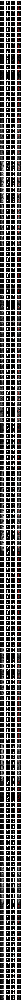

In [507]:
plot_imgs(org_imgs=X_test, mask_imgs=y_test, pred_imgs=y_pred, nm_img_to_plot=187)

In [508]:
DSC = []
JI = []
HD = []
MSD = []
PPV = []
SE = []
SP = []
ASSD = []
RAVD = []
VC = []
VCC = []
N = []

from scipy.spatial.distance import directed_hausdorff

for n in range(y_pred.shape[0]):

    y_test_slice = y_test[n,:,:,:]
    y_pred_slice = y_pred[n,:,:,:]
    
    dsc = dice_coef2(y_test_slice, y_pred_slice)
    hd = directed_hausdorff(y_test_slice[:,:,0],y_pred_slice[:,:,0])
    msd = asd(y_pred_slice, y_test_slice, voxelspacing = None, connectivity = 1)
    ppv = precision(y_pred_slice, y_test_slice)
    se = recall(y_pred_slice, y_test_slice)
    sp = specificity(y_pred_slice, y_test_slice)
    mssd = assd(y_pred_slice, y_test_slice, voxelspacing = None, connectivity = 1)
    rmvd = ravd(y_pred_slice, y_test_slice)
    vc = volume_correlation(y_pred_slice, y_test_slice)
    vcc = volume_change_correlation(y_pred_slice, y_test_slice)
    iou = dsc/(2 - dsc)
    
    PPV.append(ppv)
    MSD.append(msd)
    DSC.append(dsc)
    JI.append(iou)
    HD.append(hd[0])
    SE.append(se)
    SP.append(sp)
    ASSD.append(mssd)
    RAVD.append(rmvd)
    VC.append(vc)
    VCC.append(vcc)
    N.append(n)
    
    print(n,dsc,iou,hd[0],msd,ppv,se,sp,mssd,rmvd,vc[0],vcc[0])


/Applications/anaconda3/envs/myenv/lib/python3.7/site-packages/scipy/stats/stats.py:3508: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


0 0.8988057518981458 0.8162099951461165 2.969610514549861 100.01988545176022 0.07589388200183654 1.0 0.0 50.00994272588011 12.176292655260422 nan nan
1 0.8929578120806095 0.8066158831388912 3.2356286931798723 99.36416957571575 0.07824337121212122 1.0 0.0 49.682084787857875 11.780635400907716 nan nan
2 0.9006515498062614 0.8192593982804444 3.737257230955781 99.24711428751668 0.07980013200183654 1.0 0.0 49.62355714375834 11.531307592034882 nan nan
3 0.8952643647056159 0.8103878757084274 3.5860322187077536 98.89083964573456 0.0808977559687787 1.0 0.0 49.44541982286728 11.361282312774353 nan nan
4 0.8972057199853769 0.8135748763345779 3.576430928282118 99.36277387094539 0.08105199724517906 1.0 0.0 49.681386935472695 11.337758895379713 nan nan
5 0.9012210236007407 0.8202022817674184 3.4084814777193015 99.80994199352237 0.07901099058769513 1.0 0.0 49.904970996761186 11.65646706314977 nan nan
6 0.8912725675977323 0.8038698615642815 3.4116015008118805 100.58937812848455 0.07453799357208449 1.0

56 0.8026194805596302 0.6703127932419992 3.9601595523138693 103.08394299082387 0.05325269742883379 1.0 0.0 51.541971495411936 17.778391485922135 nan nan
57 0.8039484267271122 0.6721686963106277 3.689887961412127 101.7352216935678 0.06035855716253444 1.0 0.0 50.8676108467839 15.567659119272598 nan nan
58 0.8114705068105466 0.6827516788270368 4.148084912268078 101.30217884052952 0.06269369834710743 1.0 0.0 50.65108942026476 14.950566426364572 nan nan
59 0.8241697980268039 0.7009258621217075 3.8010390267352827 101.4241721332562 0.06057019054178145 1.0 0.0 50.7120860666281 15.509771408267204 nan nan
60 0.8157367373865365 0.6888136811627062 3.2898242990942146 101.03179162388282 0.061240960743801656 1.0 0.0 50.51589581194141 15.328940432261465 nan nan
61 0.8150078965697367 0.6877749600275711 3.6698838111370553 101.20199555466006 0.06128041781450872 1.0 0.0 50.60099777733003 15.31842659798642 nan nan
62 0.8041580422741266 0.6724618057417803 3.6083546771382453 102.24955692091949 0.058098743112

112 0.8545126269473047 0.745981707917085 4.507353773497569 93.53426621263573 0.0849654212580349 1.0 0.0 46.767133106317864 10.76949381517288 nan nan
113 0.8617275429152996 0.7570485761575246 3.628290585731072 93.24024023178376 0.08936667814508724 1.0 0.0 46.62012011589188 10.189853094645581 nan nan
114 0.8952887003635157 0.8104277566981699 3.5495031664049024 93.768043844691 0.08833720730027549 1.0 0.0 46.8840219223455 10.320258253136801 nan nan
115 0.8926868748555956 0.8061738406100628 3.955535981012701 93.42456099855656 0.08915863177226814 1.0 0.0 46.71228049927828 10.215963952365627 nan nan
116 0.8951582627189824 0.8102140175496447 4.304513562114138 93.41918412860373 0.09050734618916437 1.0 0.0 46.709592064301866 10.048826886493341 nan nan
117 0.8921206324935365 0.8052506966543284 4.131173538478899 93.65907009726938 0.08855242768595041 1.0 0.0 46.82953504863469 10.292745169522421 nan nan
118 0.878426393628125 0.783208867111009 4.841178683443601 92.6023394672317 0.08845916551882461 1.

168 0.8452781112970889 0.7320187826755257 3.7956631872279063 98.63224346333612 0.07828282828282829 1.0 0.0 49.31612173166806 11.774193548387096 nan nan
169 0.8842500843923197 0.79251638025957 3.8919346153863015 100.25043638354383 0.07684085169880625 1.0 0.0 50.125218191771914 12.013910932686024 nan nan
170 0.8862071643685373 0.7956660664513108 4.333183436199528 99.52127601743005 0.07855902777777778 1.0 0.0 49.76063800871503 11.7292817679558 nan nan
171 0.8880884185490349 0.7987041715944202 4.109380118712398 99.58034449085827 0.08003328741965106 1.0 0.0 49.79017224542913 11.494801003944065 nan nan
172 0.890127670312008 0.8020090658195266 4.039802951885548 99.28323679888366 0.08028079086317723 1.0 0.0 49.64161839944183 11.456279880255574 nan nan
173 0.894007007403331 0.8083297212438628 4.316931809775291 99.89066437134944 0.07917599288337925 1.0 0.0 49.94533218567472 11.630091061477824 nan nan
174 0.8934536148650079 0.8074253613471538 4.6273878007721825 99.68118080237589 0.079448605371900

In [509]:
a = np.vstack([N,DSC,JI,PPV,SE,SP,HD,MSD,ASSD,RAVD])

A = pd.DataFrame(a).T
print(A)

         0         1         2         3    4    5         6           7  \
0      0.0  0.898806  0.816210  0.075894  1.0  0.0  2.969611  100.019885   
1      1.0  0.892958  0.806616  0.078243  1.0  0.0  3.235629   99.364170   
2      2.0  0.900652  0.819259  0.079800  1.0  0.0  3.737257   99.247114   
3      3.0  0.895264  0.810388  0.080898  1.0  0.0  3.586032   98.890840   
4      4.0  0.897206  0.813575  0.081052  1.0  0.0  3.576431   99.362774   
..     ...       ...       ...       ...  ...  ...       ...         ...   
182  182.0  0.869273  0.768774  0.078609  1.0  0.0  3.863535   99.328540   
183  183.0  0.871095  0.771629  0.079000  1.0  0.0  3.863125   99.729134   
184  184.0  0.870674  0.770968  0.079854  1.0  0.0  4.294931   99.444346   
185  185.0  0.872034  0.773102  0.077006  1.0  0.0  3.941174   95.250772   
186  186.0  0.858288  0.751755  0.075306  1.0  0.0  4.149190  100.402122   

             8          9  
0    50.009943  12.176293  
1    49.682085  11.780635  
2  

In [510]:
import numpy
numpy.savetxt("2d_unet_hc_test_hc.csv", a, delimiter=",")

In [511]:
DSC = np.array(DSC)
JI = np.array(JI)
PPV = np.array(PPV)
SE = np.array(SE)
SP = np.array(SP)
HD = np.array(HD)
MSD = np.array(MSD)
ASSD = np.array(ASSD)
RAVD = np.array(RAVD)
VC = np.array(VC)
VC2 = VC[:,0]
VCC = np.array(VCC)
VCC2 = VCC[:,0]

print(np.mean(DSC))
print(np.std(DSC))
print(np.mean(JI))
print(np.std(JI))
print(np.mean(PPV))
print(np.std(PPV))
print(np.mean(SE))
print(np.std(SE))
print(np.mean(SP))
print(np.std(SP))
print(np.mean(HD))
print(np.std(HD))
print(np.mean(MSD))
print(np.std(MSD))
print(np.mean(ASSD))
print(np.std(ASSD))
print(np.mean(RAVD))
print(np.std(RAVD))
print(np.mean(VC2))
print(np.std(VC2))
print(np.mean(VCC2))
print(np.std(VCC2))

0.8653934601647735
0.032097821635365384
0.7640755724800022
0.04778470789096515
0.06908539852830689
0.010583949023694734
1.0
0.0
0.0
0.0
3.7158235950302774
0.5418911174312203
99.91033261231547
3.4213815174255706
49.955166306157736
1.7106907587127853
13.850924278287762
2.502932363613511
nan
nan
nan
nan
